In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [5]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df_m = merge(train_df)
merged_test_df_m = merge(test_df)

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
    #######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(merged_train_df_m, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()

In [6]:
def preprocessing(df):
    df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    #df.loc[('2022-08-15'<=df.date_time)&('2022-06-01'<=df.date_time)&('2022-06-06'<=df.date_time), 'holiday'] = 1
    df['date_time'] = df['date_time'].apply(lambda x : int(x[0:8]))
    df.loc[(df.date_time == 20220601, 'holiday')] = 1
    df.loc[(df.date_time == 20220606, 'holiday')] = 1
    df.loc[(df.date_time == 20220815, 'holiday')] = 1

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32

    
    return df

merged_train_df_m =preprocessing(merged_train_df_m)
merged_test_df_m =preprocessing(merged_test_df_m)


100%|██████████| 16800/16800 [00:06<00:00, 2780.78it/s]


In [7]:

def data_train(df):

    df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #grouped = df.groupby(['building_number', 'week', 'day'])
    grouped = df.groupby(['building_number', 'date_time'])

    df['max_power'] = grouped['power_consumption'].transform(np.max)
    df['min_power'] = grouped['power_consumption'].transform(np.min)
    
    #grouped2 = df.groupby(['building_number', 'week', 'day','holiday'])
    grouped2 = df.groupby(['building_number', 'day'])

    df['max_power'] = grouped2['max_power'].transform(np.mean)
    df['min_power'] = grouped2['min_power'].transform(np.mean)

    df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area','cooling_area'],inplace= True)
    df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area'],inplace= True)

    return df

def data_test(df):

    df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    #df.drop(columns=['max_power', 'min_power'])
    grouped_train = merged_train_df.groupby(['building_number', 'day'])
    max_power = grouped_train['max_power'].median()
    min_power = grouped_train['min_power'].median()
    max_power_df = max_power.reset_index()
    min_power_df = min_power.reset_index()

    # 테스트 데이터에 max_power_median와 min_power_median을 추가
    df = pd.merge(df, max_power_df, on=['building_number', 'day'])
    df = pd.merge(df, min_power_df, on=['building_number', 'day'])

    df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    #df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area','cooling_area'],inplace= True)
    df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area'],inplace= True)

    return df



merged_train_df =data_train(merged_train_df_m)
merged_test_df =data_test(merged_test_df_m)


In [8]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 24 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   building_number              204000 non-null  int64  
 1   date_time                    204000 non-null  int64  
 2   temperature                  204000 non-null  float64
 3   rainfall                     204000 non-null  float64
 4   windspeed                    204000 non-null  float64
 5   humidity                     204000 non-null  float64
 6   power_consumption            204000 non-null  float64
 7   hour                         204000 non-null  int64  
 8   day                          204000 non-null  int64  
 9   month                        204000 non-null  int64  
 10  week                         204000 non-null  int64  
 11  cooling_area                 204000 non-null  float64
 12  day_hour_mean                204000 non-null  float64
 13 

In [9]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_holly_lbw.csv')
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_holly_lbw.csv')

## 추가 전처리

In [10]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_holly_lbw.csv')
merged_test_df = pd.read_csv('./data/test_preprocessed_holly_lbw.csv')


In [11]:
merged_train_df = merged_train_df.drop(columns = 'Unnamed: 0')
merged_test_df = merged_test_df.drop(columns = 'Unnamed: 0')

## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [12]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

In [ ]:
# for i in np.arange(0.8, 1.0, 0.1):
#     print(i)
# for i in np.arange(1, 101, 1):
#     print(i)   

## 최적의 파라미터 탐색

In [13]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 12, 1),
        'max_depth' : np.arange(3,10,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0,tree_method="hist"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb_holly_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 308 candidates, totalling 308 fits


  1%|          | 1/100 [00:24<41:01, 24.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.565387104529734
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  2%|▏         | 2/100 [00:53<44:24, 27.19s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 41.35364404980004
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  3%|▎         | 3/100 [01:18<42:10, 26.08s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 40.607585079413646
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  4%|▍         | 4/100 [01:37<37:20, 23.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 43.34852623533
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  5%|▌         | 5/100 [02:03<38:12, 24.13s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 46.45176799747448
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  6%|▌         | 6/100 [02:25<36:56, 23.58s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.52630264106113
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  7%|▋         | 7/100 [02:50<37:13, 24.02s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building7|| SMAPE : 42.44576315089647
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  8%|▊         | 8/100 [03:09<34:34, 22.55s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building8|| SMAPE : 44.97461317844775
Fitting 1 folds for each of 308 candidates, totalling 308 fits


  9%|▉         | 9/100 [03:33<34:30, 22.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 45.57887310133883
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 10%|█         | 10/100 [03:53<33:02, 22.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building10|| SMAPE : 45.354856416271616
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 11%|█         | 11/100 [04:12<31:18, 21.11s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building11|| SMAPE : 43.21332130282481
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 12%|█▏        | 12/100 [04:33<30:57, 21.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.75813629989832
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 13%|█▎        | 13/100 [04:53<30:12, 20.83s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building13|| SMAPE : 45.1048754326317
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 14%|█▍        | 14/100 [05:19<32:07, 22.41s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building14|| SMAPE : 42.80306059094397
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 15%|█▌        | 15/100 [05:39<30:40, 21.65s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 42.749665036510216
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 16%|█▌        | 16/100 [06:02<30:53, 22.06s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 44.31439046330708
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 17%|█▋        | 17/100 [06:26<31:13, 22.57s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 47.51060951479114
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 18%|█▊        | 18/100 [06:49<31:01, 22.70s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 48.085095882903786
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 19%|█▉        | 19/100 [07:13<31:02, 23.00s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building19|| SMAPE : 49.24008598065616
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 20%|██        | 20/100 [07:35<30:30, 22.88s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building20|| SMAPE : 45.92671521894465
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 21%|██        | 21/100 [08:02<31:38, 24.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 45.102908531887685
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 22%|██▏       | 22/100 [08:28<32:03, 24.66s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.74763649765898
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 23%|██▎       | 23/100 [08:53<31:39, 24.67s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 45.280656685831396
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 24%|██▍       | 24/100 [09:16<30:40, 24.21s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
building24|| SMAPE : 44.245876516854956
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 25%|██▌       | 25/100 [09:38<29:30, 23.60s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 46.63593180329748
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 26%|██▌       | 26/100 [10:02<29:15, 23.72s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building26|| SMAPE : 44.80475806463651
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 27%|██▋       | 27/100 [10:24<28:10, 23.16s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 43.860133004626654
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 28%|██▊       | 28/100 [10:47<27:36, 23.01s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8}
building28|| SMAPE : 42.522392020867855
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 29%|██▉       | 29/100 [11:09<27:00, 22.83s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building29|| SMAPE : 43.00291583314505
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 30%|███       | 30/100 [11:36<27:53, 23.90s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building30|| SMAPE : 45.361854347424874
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 31%|███       | 31/100 [12:00<27:34, 23.98s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building31|| SMAPE : 42.42846868541633
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 32%|███▏      | 32/100 [12:14<23:53, 21.08s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.54623381252166
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 33%|███▎      | 33/100 [12:28<21:01, 18.83s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 44.950568494845506
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 34%|███▍      | 34/100 [12:42<19:14, 17.50s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building34|| SMAPE : 44.85232990049593
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 35%|███▌      | 35/100 [12:55<17:36, 16.25s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 45.02548856717104
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 36%|███▌      | 36/100 [13:08<16:17, 15.28s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building36|| SMAPE : 44.981650377384206
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 37%|███▋      | 37/100 [13:33<19:08, 18.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building37|| SMAPE : 45.02669889413357
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 38%|███▊      | 38/100 [13:59<21:01, 20.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building38|| SMAPE : 45.42492272282496
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 39%|███▉      | 39/100 [14:23<21:54, 21.54s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building39|| SMAPE : 46.455183607975925
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 40%|████      | 40/100 [14:50<23:06, 23.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 42.255818228483264
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 41%|████      | 41/100 [15:17<23:57, 24.36s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 45.671341924868
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 42%|████▏     | 42/100 [16:05<30:27, 31.51s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 44.86741146053469
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 43%|████▎     | 43/100 [16:30<28:04, 29.55s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building43|| SMAPE : 45.88517713746914
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 44%|████▍     | 44/100 [16:54<25:50, 27.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building44|| SMAPE : 44.05418163921441
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 45%|████▌     | 45/100 [17:15<23:32, 25.68s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.24655727307984
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 46%|████▌     | 46/100 [17:37<22:20, 24.82s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.43309110166602
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 47%|████▋     | 47/100 [18:00<21:23, 24.21s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building47|| SMAPE : 43.45978441164742
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 48%|████▊     | 48/100 [18:23<20:38, 23.82s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 45.55467631374303
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 49%|████▉     | 49/100 [18:44<19:30, 22.95s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building49|| SMAPE : 47.713025615049055
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 50%|█████     | 50/100 [19:05<18:31, 22.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 43.75441420610617
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 51%|█████     | 51/100 [19:27<18:09, 22.24s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 46.73243856449651
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 52%|█████▏    | 52/100 [19:49<17:44, 22.19s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 46.29256443576542
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 53%|█████▎    | 53/100 [20:17<18:48, 24.01s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building53|| SMAPE : 41.34602544375175
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 54%|█████▍    | 54/100 [20:46<19:24, 25.32s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building54|| SMAPE : 50.526725530250275
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 55%|█████▌    | 55/100 [21:02<16:54, 22.54s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building55|| SMAPE : 45.35325846798834
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 56%|█████▌    | 56/100 [21:17<14:57, 20.40s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building56|| SMAPE : 44.72924911793915
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 57%|█████▋    | 57/100 [21:42<15:30, 21.63s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 45.196557859960215
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 58%|█████▊    | 58/100 [21:56<13:33, 19.37s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.50917540273011
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 59%|█████▉    | 59/100 [22:22<14:35, 21.34s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building59|| SMAPE : 43.14504498488276
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 60%|██████    | 60/100 [22:44<14:27, 21.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 45.40210376344597
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 61%|██████    | 61/100 [23:09<14:45, 22.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.8}
building61|| SMAPE : 43.82290978410587
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 62%|██████▏   | 62/100 [23:36<15:14, 24.06s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building62|| SMAPE : 43.86662406260568
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 63%|██████▎   | 63/100 [24:02<15:07, 24.53s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building63|| SMAPE : 43.70403121009501
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 64%|██████▍   | 64/100 [24:26<14:41, 24.49s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building64|| SMAPE : 43.324243259472965
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 65%|██████▌   | 65/100 [24:53<14:40, 25.14s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building65|| SMAPE : 41.251324250164735
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 66%|██████▌   | 66/100 [25:14<13:36, 24.01s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 44.97382732856362
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 67%|██████▋   | 67/100 [25:39<13:22, 24.32s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building67|| SMAPE : 42.60189130415273
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 68%|██████▊   | 68/100 [26:04<13:04, 24.53s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building68|| SMAPE : 43.96974860492085
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 69%|██████▉   | 69/100 [26:26<12:16, 23.77s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building69|| SMAPE : 45.00643637305988
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 70%|███████   | 70/100 [26:51<11:55, 23.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 45.057501187016044
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 71%|███████   | 71/100 [27:14<11:27, 23.70s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building71|| SMAPE : 46.25569597922458
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 72%|███████▏  | 72/100 [27:34<10:34, 22.66s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 46.15592321952466
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 73%|███████▎  | 73/100 [27:55<10:00, 22.26s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 44.51569564756764
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 74%|███████▍  | 74/100 [28:18<09:41, 22.38s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building74|| SMAPE : 46.76605282191595
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 75%|███████▌  | 75/100 [28:42<09:31, 22.86s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8}
building75|| SMAPE : 44.33926919075214
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 76%|███████▌  | 76/100 [29:03<08:56, 22.34s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 46.162809072452944
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 77%|███████▋  | 77/100 [29:26<08:35, 22.41s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building77|| SMAPE : 45.31519939302023
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 78%|███████▊  | 78/100 [29:50<08:24, 22.92s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building78|| SMAPE : 46.206489138614444
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 79%|███████▉  | 79/100 [30:14<08:05, 23.14s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building79|| SMAPE : 45.531500747375915
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 80%|████████  | 80/100 [30:39<07:58, 23.90s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building80|| SMAPE : 46.16609044327203
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 81%|████████  | 81/100 [31:04<07:38, 24.13s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.655073792600604
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 82%|████████▏ | 82/100 [31:29<07:20, 24.45s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building82|| SMAPE : 44.28035180571763
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 83%|████████▎ | 83/100 [31:56<07:05, 25.05s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building83|| SMAPE : 45.73869679093252
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 84%|████████▍ | 84/100 [32:22<06:48, 25.53s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.8}
building84|| SMAPE : 44.82398353624473
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 85%|████████▌ | 85/100 [32:44<06:04, 24.27s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 47.1135677952279
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 86%|████████▌ | 86/100 [33:08<05:42, 24.43s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building86|| SMAPE : 45.6891640951013
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 87%|████████▋ | 87/100 [33:37<05:33, 25.67s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.33704904641371
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 88%|████████▊ | 88/100 [34:04<05:13, 26.13s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building88|| SMAPE : 44.437723725020035
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 89%|████████▉ | 89/100 [34:31<04:48, 26.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.8}
building89|| SMAPE : 44.92227120593323
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 90%|█████████ | 90/100 [34:57<04:23, 26.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 9, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building90|| SMAPE : 46.618462286927844
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 91%|█████████ | 91/100 [35:23<03:56, 26.29s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 11, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 49.35895280111446
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 92%|█████████▏| 92/100 [35:48<03:26, 25.82s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building92|| SMAPE : 43.184625785006624
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 93%|█████████▎| 93/100 [36:12<02:57, 25.39s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building93|| SMAPE : 43.63886642479752
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 94%|█████████▍| 94/100 [36:39<02:33, 25.60s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 8, 'n_estimators': 100, 'subsample': 0.9}
building94|| SMAPE : 46.564381273164116
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 95%|█████████▌| 95/100 [37:04<02:08, 25.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 9, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 40.27455816632967
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 96%|█████████▌| 96/100 [37:27<01:38, 24.63s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 42.84046877532934
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 97%|█████████▋| 97/100 [37:53<01:15, 25.10s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 10, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 47.58860563554675
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 98%|█████████▊| 98/100 [38:20<00:51, 25.82s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building98|| SMAPE : 37.655522772646734
Fitting 1 folds for each of 308 candidates, totalling 308 fits


 99%|█████████▉| 99/100 [38:44<00:25, 25.32s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 44.68296031126745
Fitting 1 folds for each of 308 candidates, totalling 308 fits


100%|██████████| 100/100 [39:09<00:00, 23.49s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 45.576600223619714


In [14]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly_lbw.csv')

In [15]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0,tree_method="hist", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [03:15<00:00,  1.96s/it]


In [16]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed=0,tree_method="hist",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))
    

  1%|          | 1/100 [00:23<39:28, 23.93s/it]

building 1 || best score : 4.704337696071902 || alpha : 10


  2%|▏         | 2/100 [00:34<26:25, 16.17s/it]

building 2 || best score : 7.46526456785136 || alpha : 5


  3%|▎         | 3/100 [00:39<17:37, 10.90s/it]

building 3 || best score : 7.208116640602705 || alpha : 1


  4%|▍         | 4/100 [00:45<14:44,  9.21s/it]

building 4 || best score : 3.617900163332145 || alpha : 3


  5%|▌         | 5/100 [01:04<19:52, 12.55s/it]

building 5 || best score : 3.2264268868399344 || alpha : 50


  6%|▌         | 6/100 [01:12<17:20, 11.06s/it]

building 6 || best score : 2.2945306796273846 || alpha : 7


  7%|▋         | 7/100 [01:17<13:58,  9.01s/it]

building 7 || best score : 7.63694880299323 || alpha : 5


  8%|▊         | 8/100 [01:22<12:08,  7.92s/it]

building 8 || best score : 4.402765578474734 || alpha : 0


  9%|▉         | 9/100 [01:35<14:25,  9.51s/it]

building 9 || best score : 2.638668834088356 || alpha : 1


 10%|█         | 10/100 [01:42<12:45,  8.50s/it]

building 10 || best score : 4.367282970641991 || alpha : 3


 11%|█         | 11/100 [01:48<11:46,  7.94s/it]

building 11 || best score : 2.5415289175066405 || alpha : 75


 12%|█▏        | 12/100 [01:58<12:25,  8.47s/it]

building 12 || best score : 1.928701141093875 || alpha : 7


 13%|█▎        | 13/100 [02:05<11:34,  7.99s/it]

building 13 || best score : 3.879433583082869 || alpha : 75


 14%|█▍        | 14/100 [02:09<09:39,  6.74s/it]

building 14 || best score : 12.908121839836694 || alpha : 25


 15%|█▌        | 15/100 [02:16<09:45,  6.89s/it]

building 15 || best score : 2.4325143947241195 || alpha : 75


 16%|█▌        | 16/100 [02:24<10:06,  7.22s/it]

building 16 || best score : 3.394521646161333 || alpha : 5


 17%|█▋        | 17/100 [02:31<10:01,  7.24s/it]

building 17 || best score : 5.0234088030675315 || alpha : 75


 18%|█▊        | 18/100 [02:45<12:40,  9.27s/it]

building 18 || best score : 5.7565613029458325 || alpha : 5


 19%|█▉        | 19/100 [02:57<13:20,  9.88s/it]

building 19 || best score : 5.982851417243466 || alpha : 10


 20%|██        | 20/100 [03:27<21:30, 16.13s/it]

building 20 || best score : 3.4243840088389352 || alpha : 0


 21%|██        | 21/100 [03:33<17:00, 12.91s/it]

building 21 || best score : 5.670351707750448 || alpha : 0


 22%|██▏       | 22/100 [03:40<14:24, 11.09s/it]

building 22 || best score : 2.9218824224377076 || alpha : 7


 23%|██▎       | 23/100 [03:49<13:30, 10.53s/it]

building 23 || best score : 1.3095206696499386 || alpha : 7


 24%|██▍       | 24/100 [03:57<12:36,  9.96s/it]

building 24 || best score : 1.7206934788006236 || alpha : 100


 25%|██▌       | 25/100 [04:06<11:48,  9.45s/it]

building 25 || best score : 1.863482148722705 || alpha : 50


 26%|██▌       | 26/100 [04:13<10:50,  8.79s/it]

building 26 || best score : 1.9058276460133496 || alpha : 75


 27%|██▋       | 27/100 [04:21<10:19,  8.48s/it]

building 27 || best score : 1.2173898870000963 || alpha : 50


 28%|██▊       | 28/100 [04:27<09:20,  7.79s/it]

building 28 || best score : 3.488151280132301 || alpha : 1


 29%|██▉       | 29/100 [04:33<08:29,  7.17s/it]

building 29 || best score : 2.913307975942096 || alpha : 25


 30%|███       | 30/100 [04:38<07:41,  6.59s/it]

building 30 || best score : 5.773783459333077 || alpha : 0


 31%|███       | 31/100 [04:45<07:56,  6.91s/it]

building 31 || best score : 3.639208456595352 || alpha : 0


 32%|███▏      | 32/100 [04:54<08:22,  7.39s/it]

building 32 || best score : 0.38573901360383317 || alpha : 7


 33%|███▎      | 33/100 [05:04<09:04,  8.12s/it]

building 33 || best score : 0.35092363810176186 || alpha : 25


 34%|███▍      | 34/100 [05:13<09:10,  8.34s/it]

building 34 || best score : 0.6035587613002096 || alpha : 25


 35%|███▌      | 35/100 [05:22<09:29,  8.76s/it]

building 35 || best score : 0.33191116750236194 || alpha : 75


 36%|███▌      | 36/100 [05:33<10:00,  9.39s/it]

building 36 || best score : 0.3020922408837654 || alpha : 10


 37%|███▋      | 37/100 [05:40<08:57,  8.53s/it]

building 37 || best score : 2.957929118773426 || alpha : 7


 38%|███▊      | 38/100 [05:51<09:45,  9.44s/it]

building 38 || best score : 3.0615925415269833 || alpha : 3


 39%|███▉      | 39/100 [06:06<11:05, 10.90s/it]

building 39 || best score : 2.297993817304635 || alpha : 5


 40%|████      | 40/100 [06:12<09:29,  9.49s/it]

building 40 || best score : 7.130146815019371 || alpha : 0


 41%|████      | 41/100 [06:22<09:22,  9.54s/it]

building 41 || best score : 3.1717211242007695 || alpha : 1


 42%|████▏     | 42/100 [06:30<09:02,  9.36s/it]

building 42 || best score : 3.8404790581807773 || alpha : 1


 43%|████▎     | 43/100 [06:38<08:30,  8.96s/it]

building 43 || best score : 4.471485694484783 || alpha : 3


 44%|████▍     | 44/100 [06:47<08:21,  8.96s/it]

building 44 || best score : 3.0017435286891936 || alpha : 1


 45%|████▌     | 45/100 [06:58<08:36,  9.40s/it]

building 45 || best score : 1.5611191934500346 || alpha : 25


 46%|████▌     | 46/100 [07:04<07:29,  8.32s/it]

building 46 || best score : 3.350979363081505 || alpha : 100


 47%|████▋     | 47/100 [07:11<07:11,  8.14s/it]

building 47 || best score : 3.5747116374245143 || alpha : 10


 48%|████▊     | 48/100 [07:22<07:46,  8.97s/it]

building 48 || best score : 1.4697477021799603 || alpha : 10


 49%|████▉     | 49/100 [07:32<07:56,  9.33s/it]

building 49 || best score : 1.944510933808971 || alpha : 75


 50%|█████     | 50/100 [07:40<07:14,  8.69s/it]

building 50 || best score : 1.5630912823411867 || alpha : 5


 51%|█████     | 51/100 [07:57<09:06, 11.15s/it]

building 51 || best score : 2.6295700115901925 || alpha : 100


 52%|█████▏    | 52/100 [08:07<08:44, 10.93s/it]

building 52 || best score : 2.690404428985994 || alpha : 7


 53%|█████▎    | 53/100 [08:13<07:23,  9.44s/it]

building 53 || best score : 8.92028246814492 || alpha : 0


 54%|█████▍    | 54/100 [08:23<07:20,  9.58s/it]

building 54 || best score : 11.081447678522817 || alpha : 25


 55%|█████▌    | 55/100 [08:42<09:21, 12.49s/it]

building 55 || best score : 1.3336220362671456 || alpha : 10


 56%|█████▌    | 56/100 [08:57<09:39, 13.17s/it]

building 56 || best score : 0.4954370922897757 || alpha : 100


 57%|█████▋    | 57/100 [09:08<08:59, 12.55s/it]

building 57 || best score : 3.206453013069258 || alpha : 3


 58%|█████▊    | 58/100 [09:22<09:05, 12.99s/it]

building 58 || best score : 0.34224944730511375 || alpha : 7


 59%|█████▉    | 59/100 [09:30<07:51, 11.49s/it]

building 59 || best score : 4.251644551486673 || alpha : 3


 60%|██████    | 60/100 [09:37<06:52, 10.30s/it]

building 60 || best score : 4.59819707598275 || alpha : 3


 61%|██████    | 61/100 [09:52<07:33, 11.63s/it]

building 61 || best score : 2.293775146964804 || alpha : 50


 62%|██████▏   | 62/100 [10:00<06:40, 10.54s/it]

building 62 || best score : 3.1168016819304025 || alpha : 0


 63%|██████▎   | 63/100 [10:10<06:18, 10.23s/it]

building 63 || best score : 3.241530006673549 || alpha : 1


 64%|██████▍   | 64/100 [10:26<07:12, 12.02s/it]

building 64 || best score : 2.597840943269481 || alpha : 3


 65%|██████▌   | 65/100 [10:33<06:08, 10.52s/it]

building 65 || best score : 8.254464158273764 || alpha : 100


 66%|██████▌   | 66/100 [10:45<06:17, 11.11s/it]

building 66 || best score : 1.8746666798576141 || alpha : 25


 67%|██████▋   | 67/100 [10:54<05:41, 10.34s/it]

building 67 || best score : 3.4781296795736356 || alpha : 1


 68%|██████▊   | 68/100 [11:04<05:23, 10.12s/it]

building 68 || best score : 2.6768583138736344 || alpha : 3


 69%|██████▉   | 69/100 [11:13<05:03,  9.80s/it]

building 69 || best score : 2.4398540740145225 || alpha : 3


 70%|███████   | 70/100 [11:21<04:44,  9.48s/it]

building 70 || best score : 2.4688515846577257 || alpha : 5


 71%|███████   | 71/100 [11:30<04:25,  9.16s/it]

building 71 || best score : 2.852242896074656 || alpha : 10


 72%|███████▏  | 72/100 [11:39<04:16,  9.14s/it]

building 72 || best score : 2.0627671613252017 || alpha : 5


 73%|███████▎  | 73/100 [11:49<04:13,  9.38s/it]

building 73 || best score : 2.647240829415443 || alpha : 1


 74%|███████▍  | 74/100 [12:03<04:44, 10.95s/it]

building 74 || best score : 4.854870275082331 || alpha : 0


 75%|███████▌  | 75/100 [12:12<04:12, 10.11s/it]

building 75 || best score : 2.2950060109687236 || alpha : 3


 76%|███████▌  | 76/100 [12:23<04:14, 10.61s/it]

building 76 || best score : 3.1805968748682805 || alpha : 25


 77%|███████▋  | 77/100 [12:41<04:52, 12.70s/it]

building 77 || best score : 1.745631484706202 || alpha : 7


 78%|███████▊  | 78/100 [12:53<04:33, 12.44s/it]

building 78 || best score : 2.560051540661821 || alpha : 75


 79%|███████▉  | 79/100 [13:02<04:04, 11.63s/it]

building 79 || best score : 1.8578611426255591 || alpha : 75


 80%|████████  | 80/100 [13:15<03:56, 11.85s/it]

building 80 || best score : 2.0959257405062552 || alpha : 100


 81%|████████  | 81/100 [13:26<03:40, 11.63s/it]

building 81 || best score : 2.662110759326442 || alpha : 1


 82%|████████▏ | 82/100 [13:35<03:15, 10.89s/it]

building 82 || best score : 3.226857000287622 || alpha : 5


 83%|████████▎ | 83/100 [13:47<03:10, 11.21s/it]

building 83 || best score : 1.8799631200641649 || alpha : 100


 84%|████████▍ | 84/100 [14:40<06:21, 23.84s/it]

building 84 || best score : 1.8063282583604303 || alpha : 100


 85%|████████▌ | 85/100 [15:41<08:44, 34.94s/it]

building 85 || best score : 1.9303851906964418 || alpha : 100


 86%|████████▌ | 86/100 [16:39<09:45, 41.84s/it]

building 86 || best score : 2.5895250170819737 || alpha : 75


 87%|████████▋ | 87/100 [17:17<08:49, 40.69s/it]

building 87 || best score : 8.023666876321148 || alpha : 10


 88%|████████▊ | 88/100 [20:46<18:14, 91.25s/it]

building 88 || best score : 2.874761428739398 || alpha : 3


 89%|████████▉ | 89/100 [21:12<13:07, 71.55s/it]

building 89 || best score : 3.6528878905897173 || alpha : 1


 90%|█████████ | 90/100 [22:52<13:20, 80.00s/it]

building 90 || best score : 3.5898262343273015 || alpha : 3


 91%|█████████ | 91/100 [24:06<11:45, 78.38s/it]

building 91 || best score : 6.500361525352338 || alpha : 0


 92%|█████████▏| 92/100 [24:49<09:01, 67.63s/it]

building 92 || best score : 3.2971569331497004 || alpha : 5


 93%|█████████▎| 93/100 [25:18<06:31, 55.93s/it]

building 93 || best score : 5.367231103514219 || alpha : 0


 94%|█████████▍| 94/100 [25:44<04:43, 47.17s/it]

building 94 || best score : 4.0707610363914055 || alpha : 7


 95%|█████████▌| 95/100 [26:22<03:42, 44.42s/it]

building 95 || best score : 12.979228859483971 || alpha : 0


 96%|█████████▌| 96/100 [26:57<02:45, 41.47s/it]

building 96 || best score : 2.509421467818637 || alpha : 0


 97%|█████████▋| 97/100 [27:33<01:59, 39.85s/it]

building 97 || best score : 4.475050924951506 || alpha : 100


 98%|█████████▊| 98/100 [27:54<01:08, 34.33s/it]

building 98 || best score : 11.307589140647734 || alpha : 0


 99%|█████████▉| 99/100 [28:23<00:32, 32.66s/it]

building 99 || best score : 3.01758978155867 || alpha : 3


100%|██████████| 100/100 [28:55<00:00, 17.36s/it]

building 100 || best score : 3.8996581868182587 || alpha : 25


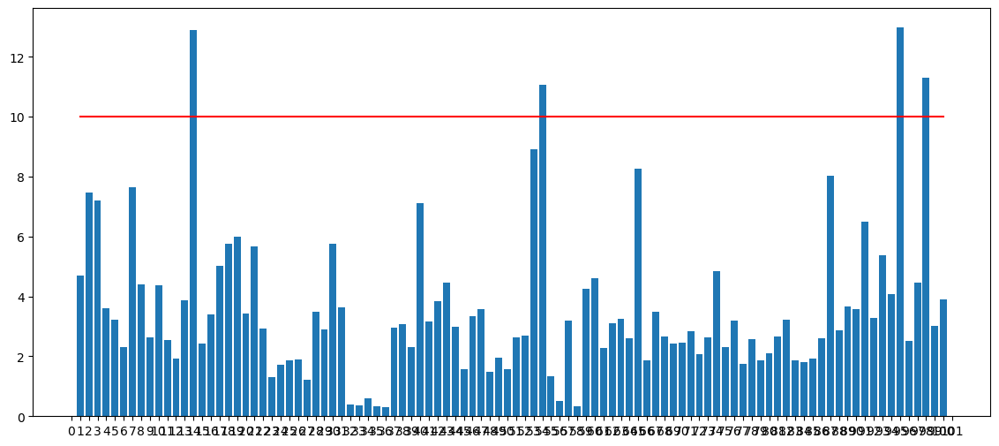

In [17]:
plt.figure(figsize=(14,6))
x_labels = np.arange(0,102)
no_df = pd.DataFrame({'score':smape_list})

plt.bar(np.arange(len(no_df))+1,no_df['score'])
plt.xticks(np.arange(102),x_labels)
plt.plot([1,100], [10, 10], color = 'red')
plt.show()

In [18]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,3,8,0.9,0.9,10,718
1,100,0.01,2,8,0.9,0.9,5,326
2,100,0.01,7,4,0.9,0.9,1,267
3,100,0.01,2,5,0.9,0.9,3,363
4,100,0.01,2,6,0.8,0.9,50,949


In [19]:
merged_test_df.head()


,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,cooling_area,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,cooling_to_total_area_ratio,max_power,min_power,solar_to_ess_ratio
0,1,23.5,0.0,2.2,72,0,3,8,34,39570.0,1627.80,1706.318118,446.882767,-2.5,0,0.000000,1.000000,58.3456,0.357666,4511.76,1537.68,0.0
1,1,23.0,0.0,0.9,72,1,3,8,34,39570.0,1550.08,1622.620235,439.662704,-5.5,0,0.258819,0.965926,57.4456,0.357666,4511.76,1537.68,0.0
2,1,22.7,0.0,1.5,75,2,3,8,34,39570.0,1431.12,1506.971294,412.071906,-8.8,0,0.500000,0.866025,57.8725,0.357666,4511.76,1537.68,0.0
3,1,22.1,0.0,1.3,78,3,3,8,34,39570.0,1372.20,1437.365647,391.205981,-12.7,0,0.707107,0.707107,57.9376,0.357666,4511.76,1537.68,0.0
4,1,21.8,0.0,1.0,77,4,3,8,34,39570.0,1381.72,1447.321412,381.099697,-16.9,0,0.866025,0.500000,56.9961,0.357666,4511.76,1537.68,0.0


In [20]:
merged_train_df.head()

,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,week,cooling_area,day_hour_mean,hour_mean,hour_std,CDH,holiday,sin_time,cos_time,THI,cooling_to_total_area_ratio,max_power,min_power,solar_to_ess_ratio
0,1,18.6,0.0,0.9,42.0,1085.28,0,2,6,22,39570.0,1774.744615,1706.318118,446.882767,-7.4,1,0.000000,1.000000,49.6576,0.357666,2730.72,953.76,0.0
1,1,18.0,0.0,1.1,45.0,1047.36,1,2,6,22,39570.0,1687.347692,1622.620235,439.662704,-15.4,1,0.258819,0.965926,47.7625,0.357666,2730.72,953.76,0.0
2,1,17.7,0.0,1.5,45.0,974.88,2,2,6,22,39570.0,1571.483077,1506.971294,412.071906,-23.7,1,0.500000,0.866025,47.2225,0.357666,2730.72,953.76,0.0
3,1,16.7,0.0,1.4,48.0,953.76,3,2,6,22,39570.0,1522.153846,1437.365647,391.205981,-33.0,1,0.707107,0.707107,44.7856,0.357666,2730.72,953.76,0.0
4,1,18.4,0.0,2.8,43.0,986.40,4,2,6,22,39570.0,1506.793846,1447.321412,381.099697,-40.6,1,0.866025,0.500000,49.0061,0.357666,2730.72,953.76,0.0


In [21]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_holly_lbw.csv', index=False)

In [22]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_holly_lbw.csv')
#best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   n_estimators      100 non-null    int64  
 1   eta               100 non-null    float64
 2   min_child_weight  100 non-null    int64  
 3   max_depth         100 non-null    int64  
 4   colsample_bytree  100 non-null    float64
 5   subsample         100 non-null    float64
 6   alpha             100 non-null    int64  
 7   best_it           100 non-null    int64  
dtypes: float64(3), int64(5)
memory usage: 6.4 KB


## 학습

In [23]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [32:47<00:00, 19.68s/it]


In [13]:
# preds = np.array([])
# for i in tqdm(np.arange(1,101,1)):

#     pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

#     for seed in [0,1,2,3,4,5]: # 각 시드별 예측
#         y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#         x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
#         x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
#         x_test = x_test[x_train.columns]
#         xgb_params.iloc[94,7]=550
#         xgb = XGBRegressor(seed = seed, n_estimators = xgb_params.iloc[i-1, 7], eta = 0.01,
#                         min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
#                         colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])
    

#         if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
#             xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

#         xgb.fit(x_train, y_train)
#         y_pred = xgb.predict(x_test)
#         pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

#     pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
#     preds = np.append(preds, pred)
    

100%|██████████| 100/100 [10:27<00:00,  6.28s/it]


## 테스트

In [24]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = merged_train_df.loc[merged_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb_holly_lbw.png')


## 제출

In [25]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./submission/submission_xgb_holly_lbw.csv', index = False)


## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 